# JAM FITTER

In [1]:
import sys,os
from fitlab.resman import RESMAN
from fitlab.mcsamp import MCSAMP
from tools.config import load_config,conf
from tools.tools import load, save,checkdir
import pylab as py
import numpy as np
import pandas as pd
import copy
def lprint(msg):
    sys.stdout.write('\r')
    sys.stdout.write('%s' %msg)
    sys.stdout.flush()
%matplotlib inline

## setup path to store the results 

In [54]:
path2results='sidis_sivers_alexei'
checkdir(path2results)
path2figs='sidis_sivers_alexei/figs'
checkdir(path2figs)

## data sets 

In [3]:
conf['datasets']={}

## SIDIS FUU 

In [4]:
conf['datasets']['sidis']={}
conf['datasets']['sidis']['filters']={}
#conf['datasets']['sidis']['filters'][0]={}
#conf['datasets']['sidis']['filters'][0]['idx']=[1000,1001,1004,1005,1002,1003,1006,1007]
##conf['datasets']['sidis']['filters'][0]['filter']="z>0.2 and z<0.6 and Q2>1.69 and (pT/z)**2<0.25*Q2 and dy>2.5"
##conf['datasets']['sidis']['filters'][0]['filter']="z>0.2 and z<0.6 and Q2>1."
##conf['datasets']['sidis']['filters'][0]['filter']="z>0.2 and z<0.6 and Q2>1.69 and (pT/z)**2<0.25*Q2 and dy>2."
#conf['datasets']['sidis']['filters'][0]['filter']="z>0.2 and z<0.6 and Q2>1.69 and pT>0.2 and pT<0.9"





conf['datasets']['sidis']['xlsx']={}

#conf['datasets']['sidis']['xlsx'][1000]='sidis/expdata/1000.xlsx'  # |  proton   | pi+    | M_Hermes | hermes 
#conf['datasets']['sidis']['xlsx'][1001]='sidis/expdata/1001.xlsx'  # |  proton   | pi-    | M_Hermes | hermes 
#conf['datasets']['sidis']['xlsx'][1004]='sidis/expdata/1004.xlsx'  # |  deuteron | pi+    | M_Hermes | hermes 
#conf['datasets']['sidis']['xlsx'][1005]='sidis/expdata/1005.xlsx'  # |  deuteron | pi-    | M_Hermes | hermes 

#conf['datasets']['sidis']['xlsx'][1002]='sidis/expdata/1002.xlsx'  # |  proton   | k+    | M_Hermes | hermes 
#conf['datasets']['sidis']['xlsx'][1003]='sidis/expdata/1003.xlsx'  # |  proton   | k-    | M_Hermes | hermes 
#conf['datasets']['sidis']['xlsx'][1006]='sidis/expdata/1006.xlsx'  # |  deuteron | k+    | M_Hermes | hermes 
#conf['datasets']['sidis']['xlsx'][1007]='sidis/expdata/1007.xlsx'  # |  deuteron | k-    | M_Hermes | hermes 


conf['datasets']['sidis']['filters'][1]={}
conf['datasets']['sidis']['filters'][1]['idx']=range(2000,2500)
conf['datasets']['sidis']['filters'][1]['filter']="Q2>1.0 and z<0.7 and pT<0.9"

conf['datasets']['sidis']['xlsx'][2000]='sidis/expdata/2000.xlsx' # proton   | pi+    | AUTsivers  | hermes     | PT 
conf['datasets']['sidis']['xlsx'][2001]='sidis/expdata/2001.xlsx' # proton   | pi+    | AUTsivers  | hermes     | x  
conf['datasets']['sidis']['xlsx'][2002]='sidis/expdata/2002.xlsx' # proton   | pi+    | AUTsivers  | hermes     | z  
conf['datasets']['sidis']['xlsx'][2003]='sidis/expdata/2003.xlsx' # proton   | pi-    | AUTsivers  | hermes     | PT 
conf['datasets']['sidis']['xlsx'][2004]='sidis/expdata/2004.xlsx' # proton   | pi-    | AUTsivers  | hermes     | x  
conf['datasets']['sidis']['xlsx'][2005]='sidis/expdata/2005.xlsx' # proton   | pi-    | AUTsivers  | hermes     | z  
#conf['datasets']['sidis']['xlsx'][2006]='../database/sidis/expdata/2006.xlsx'  # proton   | pi0    | AUTsivers  | hermes     | PT 
#conf['datasets']['sidis']['xlsx'][2007]='../database/sidis/expdata/2007.xlsx'  # proton   | pi0    | AUTsivers  | hermes     | x 
#conf['datasets']['sidis']['xlsx'][2008]='../database/sidis/expdata/2008.xlsx'  # proton   | pi0    | AUTsivers  | hermes     | z 
conf['datasets']['sidis']['xlsx'][2009]='sidis/expdata/2009.xlsx'  # proton   | k+     | AUTsivers  | hermes     | PT 
conf['datasets']['sidis']['xlsx'][2010]='sidis/expdata/2010.xlsx'  # proton   | k+     | AUTsivers  | hermes     | x
conf['datasets']['sidis']['xlsx'][2011]='sidis/expdata/2011.xlsx'  # proton   | k+     | AUTsivers  | hermes     | z 
conf['datasets']['sidis']['xlsx'][2012]='sidis/expdata/2012.xlsx'  # proton   | k-     | AUTsivers  | hermes     | PT
conf['datasets']['sidis']['xlsx'][2013]='sidis/expdata/2013.xlsx'  # proton   | k-     | AUTsivers  | hermes     | x #
conf['datasets']['sidis']['xlsx'][2014]='sidis/expdata/2014.xlsx'  # proton   | k-     | AUTsivers  | hermes     | z 
conf['datasets']['sidis']['xlsx'][2015]='sidis/expdata/2015.xlsx'  # neutron  | pi+    | AUTsivers  | jlab       | x 
conf['datasets']['sidis']['xlsx'][2016]='sidis/expdata/2016.xlsx'  # neutron  | pi-    | AUTsivers  | jlab       | x
#conf['datasets']['sidis']['xlsx'][2017]='../database/sidis/expdata/2017.xlsx'  # proton   | k0     | AUTsivers  | compass    | PT 
#conf['datasets']['sidis']['xlsx'][2018]='../database/sidis/expdata/2018.xlsx'  # proton   | k0     | AUTsivers  | compass    | x
#conf['datasets']['sidis']['xlsx'][2019]='../database/sidis/expdata/2019.xlsx'  # proton   | k0     | AUTsivers  | compass    | z
#conf['datasets']['sidis']['xlsx'][2020]='../database/sidis/expdata/2020.xlsx'  # proton   | h+     | AUTsivers  | compass    | PT
#conf['datasets']['sidis']['xlsx'][2021]='../database/sidis/expdata/2021.xlsx'  # proton   | h+     | AUTsivers  | compass    | x 
#conf['datasets']['sidis']['xlsx'][2022]='../database/sidis/expdata/2022.xlsx'  # proton   | h+     | AUTsivers  | compass    | z 
#conf['datasets']['sidis']['xlsx'][2023]='../database/sidis/expdata/2023.xlsx'  # proton   | h-     | AUTsivers  | compass    | PT 
#conf['datasets']['sidis']['xlsx'][2024]='../database/sidis/expdata/2024.xlsx'  # proton   | h-     | AUTsivers  | compass    | x
#conf['datasets']['sidis']['xlsx'][2025]='../database/sidis/expdata/2025.xlsx'  # proton   | h-     | AUTsivers  | compass    | z 
conf['datasets']['sidis']['xlsx'][2026]='sidis/expdata/2026.xlsx'  # deuteron | pi+    | AUTsivers  | compass    | PT 
conf['datasets']['sidis']['xlsx'][2027]='sidis/expdata/2027.xlsx'  # deuteron | pi+    | AUTsivers  | compass    | x 
conf['datasets']['sidis']['xlsx'][2028]='sidis/expdata/2028.xlsx'  # deuteron | pi+    | AUTsivers  | compass    | z 
conf['datasets']['sidis']['xlsx'][2029]='sidis/expdata/2029.xlsx'  # deuteron | pi-    | AUTsivers  | compass    | PT 
conf['datasets']['sidis']['xlsx'][2030]='sidis/expdata/2030.xlsx'  # deuteron | pi-    | AUTsivers  | compass    | x 
conf['datasets']['sidis']['xlsx'][2031]='sidis/expdata/2031.xlsx'  # deuteron | pi-    | AUTsivers  | compass    | z 
conf['datasets']['sidis']['xlsx'][2032]='sidis/expdata/2032.xlsx'  # deuteron | k+     | AUTsivers  | compass    | PT
conf['datasets']['sidis']['xlsx'][2033]='sidis/expdata/2033.xlsx'  # deuteron | k+     | AUTsivers  | compass    | x 
conf['datasets']['sidis']['xlsx'][2034]='sidis/expdata/2034.xlsx'  # deuteron | k+     | AUTsivers  | compass    | z 
conf['datasets']['sidis']['xlsx'][2035]='sidis/expdata/2035.xlsx'  # deuteron | k-     | AUTsivers  | compass    | PT
conf['datasets']['sidis']['xlsx'][2036]='sidis/expdata/2036.xlsx'  # deuteron | k-     | AUTsivers  | compass    | x 
conf['datasets']['sidis']['xlsx'][2037]='sidis/expdata/2037.xlsx'  # deuteron | k-     | AUTsivers  | compass    | z
conf['datasets']['sidis']['xlsx'][2038]='sidis/expdata/2038.xlsx'  # neutron  | k+     | AUTsivers  | jlab    | x 
conf['datasets']['sidis']['xlsx'][2039]='sidis/expdata/2039.xlsx'  # neutron  | k-     | AUTsivers  | jlab    | z 
#conf['datasets']['sidis']['xlsx'][2040]='sidis/expdata/2040.xlsx'  # proton   | h+     | AUTsivers  | compass    | PT (z>0.1 2040-2045) | 2017
#conf['datasets']['sidis']['xlsx'][2041]='sidis/expdata/2041.xlsx'  # proton   | h+     | AUTsivers  | compass    | x #
#conf['datasets']['sidis']['xlsx'][2042]='sidis/expdata/2042.xlsx'  # proton   | h+     | AUTsivers  | compass    | z 
#conf['datasets']['sidis']['xlsx'][2043]='sidis/expdata/2043.xlsx'  # proton   | h-     | AUTsivers  | compass    | PT 
#conf['datasets']['sidis']['xlsx'][2044]='sidis/expdata/2044.xlsx'  # proton   | h-     | AUTsivers  | compass    | x
#conf['datasets']['sidis']['xlsx'][2045]='sidis/expdata/2045.xlsx'  # proton   | h-     | AUTsivers  | compass    | z 

conf['datasets']['sidis']['norm']={}
for k in conf['datasets']['sidis']['xlsx']: conf['datasets']['sidis']['norm'][k]={'value':1,'fixed':True,'min':0,'max':1} 


## parameters

In [5]:
conf['params']={}
conf['basis']='default'
conf['shape']=1

### PDF parameters

In [6]:
conf['params']['pdf']={}
conf['params']['pdf']['widths0 valence']  = {'value':0.52414,'fixed':True,'min':0.2,'max':1.5}
conf['params']['pdf']['widths0 sea']      = {'value':0.58465,'fixed':True,'min':0.3,'max':1.8}

In [7]:
conf['params']['ff']={}
conf['params']['ff']['widths0 pi+ fav']   = {'value':0.12405,'fixed':True,'min':0,'max':0.3}
conf['params']['ff']['widths0 pi+ unfav'] = {'value':0.14373,'fixed':True,'min':0,'max':0.3}
conf['params']['ff']['widths0 h+ fav']   = {'value':0.19097,'fixed':'widths0 pi+ fav','min':0,'max':1}
conf['params']['ff']['widths0 h+ unfav'] = {'value':0.18359,'fixed':'widths0 pi+ unfav','min':0,'max':1}
conf['params']['ff']['widths0 k+ fav']    = {'value':0.13384,'fixed':True,'min':0,'max':0.4}
conf['params']['ff']['widths0 k+ unfav']  = {'value':0.20266,'fixed':True,'min':0,'max':0.4}


### Sivers parameters

In [26]:
conf['params']['sivers']={}
conf['params']['sivers']['widths0 valence'] = {'value':0.29793,'fixed':False,'min':1e-5,'max':0.52414}
conf['params']['sivers']['widths0 sea']     = {'value':0.32847,'fixed':False,'min':1e-5,'max':0.58465}

conf['params']['sivers']['u N']  = {'value':-0.07776,'fixed':False,'min':-0.15,'max':0.}
conf['params']['sivers']['u a']  = {'value': -0.56617,'fixed':False,'min':-0.9,'max':0.}
conf['params']['sivers']['u b']  = {'value':2.58981,'fixed':False,'min':0,'max':4.5}
conf['params']['sivers']['u c']  = {'value':0.00998,'fixed':False,'min':-0.25,'max':0.1}
conf['params']['sivers']['u d']  = {'value':    0.00000000000000000000e+00 ,'fixed':True,'min':-2,'max':2}

conf['params']['sivers']['d N']  = {'value':0.05108,'fixed':False,'min':-0.02,'max':0.15}
conf['params']['sivers']['d a']  = {'value':-0.63088,'fixed':False,'min':-1.,'max':0.2}
conf['params']['sivers']['d b']  = {'value':3.64964,'fixed':False,'min':2,'max':6}
conf['params']['sivers']['d c']  = {'value':0.84581,'fixed':False,'min':-1.5,'max':3.5}
conf['params']['sivers']['d d']  = {'value':    0.00000000000000000000e+00 ,'fixed':True,'min':-2,'max':2}

conf['params']['sivers']['ub N']  = {'value':0.02567,'fixed':False,'min':-0.05,'max':0.07}
conf['params']['sivers']['ub a']  = {'value':0.04777,'fixed':False,'min':-0.2,'max':0.4}
conf['params']['sivers']['ub b']  = {'value':2.28470,'fixed':False,'min':-0.2,'max':5}
conf['params']['sivers']['ub c']  = {'value':1.73195,'fixed':False,'min':-2,'max':5}
conf['params']['sivers']['ub d']  = {'value':    0.00000000000000000000e+00 ,'fixed':True,'min':-2,'max':2}

conf['params']['sivers']['db N']  = {'value':0.02146,'fixed':False,'min':-0.05,'max':0.1}
conf['params']['sivers']['db a']  = {'value':-0.27272,'fixed':False,'min':-1,'max':0.2}
conf['params']['sivers']['db b']  = {'value':3.72870,'fixed':False,'min':0,'max':8}
conf['params']['sivers']['db c']  = {'value':1.42374,'fixed':False,'min':-2,'max':5}
conf['params']['sivers']['db d']  = {'value':    0.00000000000000000000e+00 ,'fixed':True,'min':-2,'max':2}

conf['params']['sivers']['sb N']  = {'value':-0.03986,'fixed':False,'min':-0.1,'max':0.02}
conf['params']['sivers']['sb a']  = {'value':0.25702,'fixed':False,'min':-0.2,'max':1}
conf['params']['sivers']['sb b']  = {'value':2.79113,'fixed':False,'min':0,'max':6}
conf['params']['sivers']['sb c']  = {'value':1.73195,'fixed':False,'min':-2,'max':5}
conf['params']['sivers']['sb d']  = {'value':    0.00000000000000000000e+00 ,'fixed':True,'min':-2,'max':2}

conf['params']['sivers']['s N']  = {'value':   -6.74236529965721448354e-02 ,'fixed':'sb N','min':-1,'max':1}
conf['params']['sivers']['s a']  = {'value':    3.01768437566481750878e-01 ,'fixed':'sb a','min':-1,'max':2}
conf['params']['sivers']['s b']  = {'value':    4.62919137075176756468e+00 ,'fixed':'sb b','min':0,'max':25}
conf['params']['sivers']['s c']  = {'value':    3.76446795161979375077e-01 ,'fixed':'sb c','min':-5,'max':5}
conf['params']['sivers']['s d']  = {'value':    0.00000000000000000000e+00 ,'fixed':'sb d','min':-2,'max':2}


## Nested Sampling

### initialize fitpack libraries

In [27]:
conf['resman'] = RESMAN()
mcsamp=MCSAMP()

loading sidis data sets 2039
multiprocess setup: ncpus=1 / observable


## Single Fit

In [ ]:
from fitlab.maxlike import ML
from qcdlib.aux import AUX
from fitlab.parman import PARMAN
conf['parman'] = PARMAN()
#conf['aux']=AUX()
ML().run_minimize()

JAM FITTER
count = 1
elapsed time(mins)=0.000363
shifts  = 0
npts    = 137
chi2    = 270.916963
rchi2   = 0.000000
nchi2   = 0.000000
chi2tot = 270.916963
dchi2(iter)  = 0.000000
dchi2(local) = -inf

reaction: sidis
    idx        tar        had        col        obs  npts       chi2      rchi2      nchi2
   2000     proton        pi+     hermes  AUTsivers     6      30.00       0.00       0.00
   2001     proton        pi+     hermes  AUTsivers     7      17.45       0.00       0.00
   2002     proton        pi+     hermes  AUTsivers     7       5.98       0.00       0.00
   2003     proton        pi-     hermes  AUTsivers     6       4.08       0.00       0.00
   2004     proton        pi-     hermes  AUTsivers     7      19.00       0.00       0.00
   2005     proton        pi-     hermes  AUTsivers     7       2.29       0.00       0.00
   2009     proton         k+     hermes  AUTsivers     6       7.13       0.00       0.00
   2010     proton         k+     hermes  AUTsivers     

KeyError: 'args'

### start multiple NS runs
- the code will start n independent runs specified by size

In [28]:
#conf['size']=10
#conf['factor']=4 # play with the factor (3,4) and the tolerance (1.e-5,1.e-10)
#conf['tol']=1e-10
conf['size']=5
conf['factor']=3 # play with the factor (3,4) and the tolerance (1.e-5,1.e-10)
conf['tol']=1e-4
mcsamp.run(path2results)

iter=195768  logz=15.370 rel-err=9.938e-11  t-elapsed=2.525e+04  dchi2min=-5.350e+01 dchi2max=-5.350e+01

### combine multiple runs into one big run

In [112]:
MC=mcsamp.get_MC_samples(path2results+'/mcdata')

runs max likelihoods
-25.2003347745
-25.2031895769
-24.8253002822
-25.2029805769
-25.2008458323
-26.7472944071
-26.7748663558
-26.7514079623
-26.7751453735
-26.7469474605
sample  size= 1623345
sample2 size= 3710


### distribution of parameters

     widths0 valence =    0.30610 +/-    0.05386
         widths0 sea =    0.32232 +/-    0.11993
                 u N =   -0.08817 +/-    0.01885
                 d N =    0.06252 +/-    0.02487
                 u a =   -0.51490 +/-    0.08157
                 d a =   -0.55773 +/-    0.13219
                 u b =    2.40936 +/-    0.49268
                 d b =    3.68108 +/-    0.70260
                 u c =   -0.00981 +/-    0.09712
                 d c =    0.83939 +/-    0.91432
                ub N =    0.02762 +/-    0.01012
                db N =    0.02549 +/-    0.01676
                ub a =    0.09132 +/-    0.10526
                db a =   -0.28384 +/-    0.18050
                ub b =    2.11261 +/-    1.00019
                db b =    3.93972 +/-    1.57796
                ub c =    1.55591 +/-    1.25368
                db c =    1.51374 +/-    1.40202
                sb N =   -0.04367 +/-    0.01733
                sb a =    0.24270 +/-    0.16255
                sb b

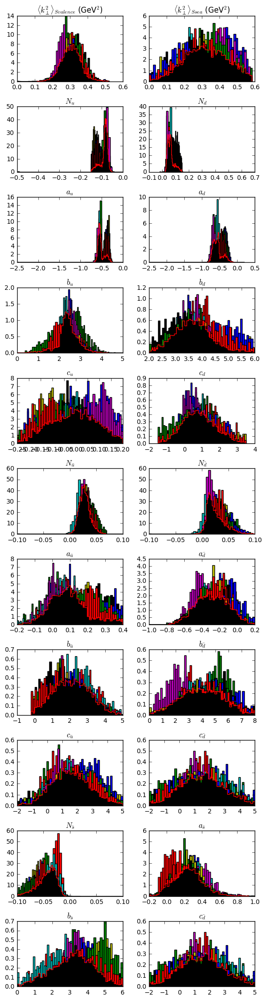

In [114]:
samples=MC['samples']
samples2=MC['samples2']
weights=MC['weights']
weights2=MC['weights2']
order=MC['order']
runs=MC['runs']

nrows,ncols=15,2
fig = py.figure(figsize=(ncols*3,nrows*2))

def get_idx(key,tag):
    for i in range(len(order)):
        if order[i][1]==key and order[i][2]==tag:
            return i

def title(tags,i):
    if tags[i] == 'widths0 valence':
        return r"$\langle k_\perp^2 \rangle_{S valence}$ (GeV$^2$)"
    if tags[i] == 'widths0 sea':
        return r"$\langle k_\perp^2 \rangle_{S sea}$ (GeV$^2$)"
    if tags[i] == 'u N':
        return r"$N_u$"
    if tags[i] == 'd N':
        return r"$N_d$"
    if tags[i] == 'u a':
        return r"$a_u$"
    if tags[i] == 'd a':
        return r"$a_d$"
    if tags[i] == 'u b':
        return r"$b_u$"
    if tags[i] == 'd b':
        return r"$b_d$"
    if tags[i] == 'u c':
        return r"$c_u$"
    if tags[i] == 'd c':
        return r"$c_d$"
    if tags[i] == 'ub N':
        return r"$N_{\bar u}$"
    if tags[i] == 'db N':
        return r"$N_{\bar d}$"
    if tags[i] == 'ub a':
        return r"$a_{\bar u}$"
    if tags[i] == 'db a':
        return r"$a_{\bar d}$"
    if tags[i] == 'ub b':
        return r"$b_{\bar u}$"
    if tags[i] == 'db b':
        return r"$b_{\bar d}$"
    if tags[i] == 'ub c':
        return r"$c_{\bar u}$"
    if tags[i] == 'db c':
        return r"$c_{\bar d}$"
    if tags[i] == 'sb N':
        return r"$N_{\bar s}$"
    if tags[i] == 'sb a':
        return r"$a_{\bar s}$"
    if tags[i] == 'sb b':
        return r"$b_{\bar s}$"
    if tags[i] == 'sb c':
        return r"$c_{\bar s}$"





 



        
        
        
global cnt
cnt=0
def plot(tags):
    global cnt
    for i in range(1,len(tags)):
        cnt+=1
        if tags[i]==None: continue
        idx=get_idx(tags[0],tags[i])
        ax=py.subplot(nrows,ncols,cnt)
        vmin=np.amin(samples2.T[idx])
        vmax=np.amax(samples2.T[idx])
        R=None#(vmin,vmax)
        for k in runs:
            ax.hist(runs[k]['samples'].T[idx],weights=runs[k]['weights'],bins=50,normed=True,range=R)
        ax.hist(samples.T[idx],weights=weights,bins=50,color='k',normed=True,range=R)
        ax.hist(samples2.T[idx],weights=weights2,bins=50,color='r',histtype='step',normed=True,range=R)
        #ax.set_title(tags[i])
        ax.set_title(title(tags,i))
        mean=np.einsum('i,i',samples2.T[idx],weights2)
        std=np.einsum('i,i',(samples2.T[idx]-mean)**2,weights2)**0.5
        print '%20s = %10.5f +/- %10.5f'%(tags[i],mean,std)
        #ax.set_xlim(vmin,vmax)
    py.tight_layout()
    py.savefig("%s/parameters.pdf"%path2figs)

plot(['sivers','widths0 valence','widths0 sea'])
plot(['sivers','u N','d N'])
plot(['sivers','u a','d a'])
plot(['sivers','u b','d b'])
plot(['sivers','u c','d c'])
plot(['sivers','ub N','db N'])
plot(['sivers','ub a','db a'])
plot(['sivers','ub b','db b'])
plot(['sivers','ub c','db c'])
plot(['sivers','sb N','sb a'])
plot(['sivers','sb b','db c'])







## data vs theory

In [115]:
data={'weights':MC['weights2']}
cnt=0
for s in MC['samples2']:
    cnt+=1    
    lprint('%d/%d'%(cnt,len(MC['samples2'])))  
    conf['resman'].get_residuals(s);
    for k in conf['resman'].sidisres.tabs:
        if k  not in data: data[k]=[]
        thy=conf['resman'].sidisres.tabs[k]['thy']    
        norm=conf['datasets']['sidis']['norm'][k]['value']
        shift=conf['resman'].sidisres.tabs[k]['shift']        
        data[k].append(shift+thy/norm)
save(data,'%s/%s'%(path2results,'sidis.dat'))   

3710/3710

### compute averages and collect results

In [116]:
data=load('%s/%s'%(path2results,'sidis.dat'))   
for k in data: data[k]=np.array(data[k])
thy,dthy={},{}
for k in data:
    if k=='weights': continue
    thy[k]=np.einsum('i,ik->k',data['weights'],data[k])
    dthy[k]=np.einsum('i,ik->k',data['weights'],(data[k]-thy[k])**2)**0.5
for k in thy: 
    conf['resman'].sidisres.tabs[k]['thy']=copy.copy(thy[k])
    conf['resman'].sidisres.tabs[k]['dthy']=copy.copy(dthy[k])

In [117]:
report=conf['resman'].gen_report(verb=0,level=1)
delimiters=[]
for i in range(len(report)): 
    if 'reaction:' in report[i]: delimiters.append(i) 

data={}
nlines=len(report)
for i in range(len(delimiters)):
    ini=delimiters[i]
    if i==len(delimiters)-1: fin=len(report)
    else: fin=delimiters[i+1]
    reaction=report[ini].replace('reaction:','').strip()
    data[reaction]={'raw data':report[ini:fin]}
    
for k in data:
    print k
    block=data[k]['raw data']
    isep=[i for i in range(len(block)) if '--------' in block[i]][0]
    data[k]['summary']=[block[i] for i in range(isep)]
    data[k]['tables']=[block[i] for i in range(isep+1,len(block))]

    tabs={}
    for l in data[k]['tables']:
        info=l.split(',')
        col=[s for s in info if 'col' in s][0].split('=')[1].strip()
        if col not in tabs: tabs[col]={}
        info=[[ss.strip() for ss in s.split('=')] for s in info if 'col' not in info  if s.strip()!='']
        
        for s in info:
            if s[0] not in tabs[col]: tabs[col][s[0]]=[]
        
        for s in info:
            try:
                value=float(s[1])
            except:
                value=s[1]
            tabs[col][s[0]].append(value)        

    data[k]['tabs']=tabs
save(data,'%s/%s'%(path2results,'data_and_thy.dat'))  

sidis


In [118]:
def summary():
    for k in data:
        print ""
        for l in data[k]['summary']: print l
summary()


reaction: sidis
    idx        tar        had        col        obs  npts       chi2      rchi2      nchi2
   2000     proton        pi+     hermes  AUTsivers     6       7.62       0.00       0.00
   2001     proton        pi+     hermes  AUTsivers     7      10.95       0.00       0.00
   2002     proton        pi+     hermes  AUTsivers     7       4.13       0.00       0.00
   2003     proton        pi-     hermes  AUTsivers     6       6.53       0.00       0.00
   2004     proton        pi-     hermes  AUTsivers     7      12.62       0.00       0.00
   2005     proton        pi-     hermes  AUTsivers     7       2.24       0.00       0.00
   2009     proton         k+     hermes  AUTsivers     6       2.65       0.00       0.00
   2010     proton         k+     hermes  AUTsivers     7       4.57       0.00       0.00
   2011     proton         k+     hermes  AUTsivers     7       6.80       0.00       0.00
   2012     proton         k-     hermes  AUTsivers     6       3.27     

## Plot data and theory

UndefinedVariableError: name 'Dependence' is not defined

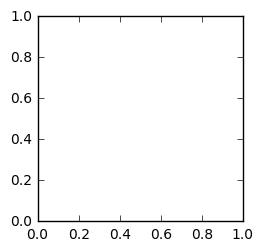

In [126]:
data=load('%s/%s'%(path2results,'data_and_thy.dat'))

nrows,ncols=3,3
fig = py.figure(figsize=(ncols*3,nrows*3))


tab=pd.DataFrame(data['sidis']['tabs']['hermes']).query('tar=="proton"')
cnt=0
for dep in ['x','z','pT']:
    cnt+=1
    if dep=='pT': _dep='pt'
    else: _dep=dep
    ax=py.subplot(nrows,ncols,cnt)
    _tab=tab.query('Dependence=="%s"'%_dep)
    pip=_tab.query('had=="pi+"')
    pim=_tab.query('had=="pi-"')
    if dep=='pT': label='P_{hT}'
    if dep=='x': label='x'
    if dep=='z': label='z'                
    ax.errorbar(pip[dep],pip['exp'],yerr=pip['alpha'],fmt='r.')
    ax.errorbar(pim[dep],pim['exp'],yerr=pim['alpha'],fmt='b.')
    ax.plot(pip[dep],pip['thy'],color='r',alpha=0.5)
    ax.plot(pim[dep],pim['thy'],color='b',alpha=0.5)
    ax.fill_between(pip[dep],(pip['thy']-pip['dthy']),(pip['thy']+pip['dthy']),color='r',alpha=0.5)
    ax.fill_between(pim[dep],(pim['thy']-pim['dthy']),(pim['thy']+pim['dthy']),color='b',alpha=0.5)
    ax.set_xlabel(r'$%s$'%label,size=20); ax.set_ylabel(r'$A_{UT}^{\sin(\phi_h+\phi_S)}$',size=20)
    ax.set_title('HERMES p')

    
tab=pd.DataFrame(data['sidis']['tabs']['compass']).query('tar=="proton"')
for dep in ['x','z','pT']:
    cnt+=1
    if dep=='pT': _dep='pt'
    else: _dep=dep
    ax=py.subplot(nrows,ncols,cnt)
    _tab=tab.query('dep=="%s"'%_dep)
    pip=_tab.query('had=="pi+"')
    pim=_tab.query('had=="pi-"')
    if dep=='pT': label='P_{hT}'
    if dep=='x': label='x'
    if dep=='z': label='z'                
    ax.errorbar(pip[dep],-pip['exp'],yerr=pip['alpha'],fmt='r.')
    ax.errorbar(pim[dep],-pim['exp'],yerr=pim['alpha'],fmt='b.')
    ax.plot(pip[dep],-pip['thy'],color='r',alpha=0.5)
    ax.plot(pim[dep],-pim['thy'],color='b',alpha=0.5)
    ax.fill_between(pip[dep],-(pip['thy']-pip['dthy']),-(pip['thy']+pip['dthy']),color='r',alpha=0.5)
    ax.fill_between(pim[dep],-(pim['thy']-pim['dthy']),-(pim['thy']+pim['dthy']),color='b',alpha=0.5)
    ax.set_xlabel(r'$%s$'%label,size=20); ax.set_ylabel(r'$A_{UT}^{\sin(\phi_h+\phi_S)}$',size=20)
    ax.set_title('COMPASS p')

tab=pd.DataFrame(data['sidis']['tabs']['compass']).query('tar=="deuteron"')
for dep in ['x','z','pT']:
    cnt+=1
    if dep=='pT': _dep='pT'
    else: _dep=dep
    if dep=='pT': label='P_{hT}'
    if dep=='x': label='x'
    if dep=='z': label='z'                
    ax=py.subplot(nrows,ncols,cnt)
    _tab=tab.query('dep=="%s"'%_dep)
    pip=_tab.query('had=="pi+"')
    pim=_tab.query('had=="pi-"')
    ax.errorbar(pip[dep],-pip['exp'],yerr=pip['alpha'],fmt='r.')
    ax.errorbar(pim[dep],-pim['exp'],yerr=pim['alpha'],fmt='b.')
    ax.plot(pip[dep],-pip['thy'],color='r',alpha=0.5)
    ax.plot(pim[dep],-pim['thy'],color='b',alpha=0.5)
    ax.fill_between(pip[dep],-(pip['thy']-pip['dthy']),-(pip['thy']+pip['dthy']),color='r',alpha=0.5)
    ax.fill_between(pim[dep],-(pim['thy']-pim['dthy']),-(pim['thy']+pim['dthy']),color='b',alpha=0.5)
    ax.set_xlabel(r'$%s$'%label,size=20); ax.set_ylabel(r'$A_{UT}^{\sin(\phi_h+\phi_S)}$',size=20)
    ax.set_title('COMPASS d')


py.tight_layout()
py.savefig("%s/data_vs_theory.pdf"%path2figs)

In [130]:
tab=pd.DataFrame(data['sidis']['tabs']['hermes']).query('tar=="proton"')
tab.columns

Index([u'Q2', u'alpha', u'chi2', u'col', u'dthy', u'dy', u'exp', u'had',
       u'idx', u'obs', u'pT', u'shift', u'tar', u'thy', u'x', u'yh', u'yp',
       u'z'],
      dtype='object')

## PDFs and FFs

In [37]:
def calc(func):
    RAW=[]
    cnt=0
    for s in MC['samples2']:
        cnt+=1    
        lprint('%d/%d'%(cnt,len(MC['samples2'])))  
        conf['parman'].set_new_params(s);    
        RAW.append(func())
    RAW=np.array(RAW)
    f =np.einsum('k,kif->if',MC['weights2'],RAW)
    df=np.einsum('k,kif->if',MC['weights2'],(RAW-f)**2)**0.5
    f=np.einsum('if->fi',f)
    df=np.einsum('if->fi',df)
    return {'f':f,'df':df}

In [38]:
X1=10**np.linspace(-3,-1)
X2=np.linspace(0.101,0.999)
X=np.append(X1,X2)
hpi=calc(lambda : [conf['sivers'].get_C(x,1) for x in X])
#h=calc(lambda : [resman.conf['sivers'].get_C(x,1) for x in X],'calc h',0)
#Hpi=calc(lambda : [conf['collins'].get_C(z,1,'pi+') for z in Z])

3710/3710

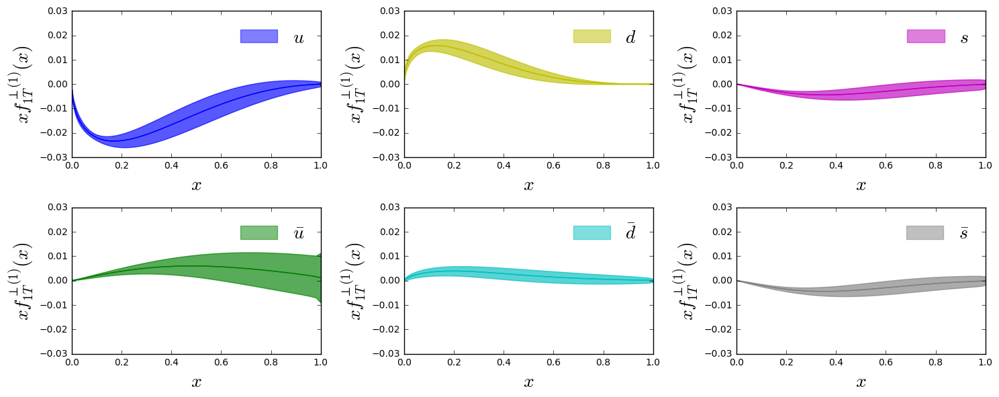

In [63]:
nrows,ncols=2,3
py.figure(figsize=(ncols*5,nrows*3))
def plot(idx,flav,run1,run2):
    ax=py.subplot(nrows,ncols,idx)
    # labels
    if flav==1: label=r'$u$'
    if flav==2: label=r'$\bar{u}$'
    if flav==3: label=r'$d$'
    if flav==4: label=r'$\bar{d}$'
    if flav==5: label=r'$s$'
    if flav==6: label=r'$\bar{s}$'
    # colors
    #if flav==1: color='r'
    #elif flav==3: color='b'
    #elif any([flav==x for x in [2,4,5,6]]): color='g'
    colors=['r','b','g','y','c','m','gray','orange','gold','k']
    # plots
    ax.fill_between(X,X*(hpi['f'][flav]-hpi['df'][flav]),X*(hpi['f'][flav]+hpi['df'][flav]),color=colors[flav],alpha=0.5,label=label)
    ax.plot(X,X*hpi['f'][flav],color=colors[flav])
    ax.fill_between(X,X*(hpi['f'][flav]-hpi['df'][flav]),X*(hpi['f'][flav]+hpi['df'][flav]),color=colors[flav],alpha=0.3)
    ax.plot(X,X*hpi['f'][flav],color=colors[flav])
    ax.set_ylabel(r'$x f_{1T}^{\perp (1)}(x)$',size=20)
    ax.set_xlabel(r'$x$',size=20)
    ax.set_ylim(-0.03,0.03)
    ax.legend(fontsize=20,frameon=False)
    return ax

id1=0
id2=0
ax=plot(1,1,id1,id2)
ax=plot(2,3,id1,id2)
ax=plot(3,5,id1,id2)
ax=plot(4,2,id1,id2)
ax=plot(5,4,id1,id2)
ax=plot(6,6,id1,id2)
py.tight_layout()
py.savefig('%s/sivers_fit.pdf'%path2figs)

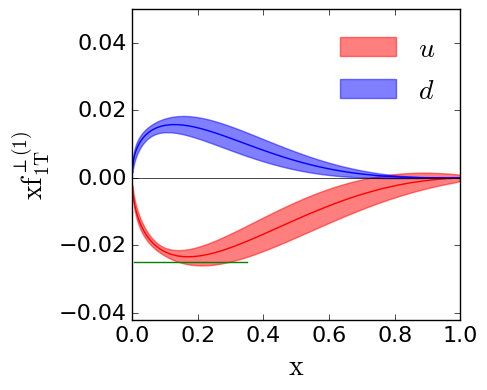

In [77]:
nrows,ncols=1,1
py.figure(figsize=(ncols*5,nrows*4))
ax=py.subplot(nrows,ncols,1)
# plots
ax.fill_between(X,X*(hpi['f'][1]-hpi['df'][1]),X*(hpi['f'][1]+hpi['df'][1]),color='r',alpha=0.5,label=r'$u$')
ax.plot(X,X*hpi['f'][1],color='r')
ax.fill_between(X,X*(hpi['f'][3]-hpi['df'][3]),X*(hpi['f'][3]+hpi['df'][3]),color='b',alpha=0.5,label=r'$d$')
ax.plot(X,X*hpi['f'][3],color='b')
# min max from data
zmin=np.amin(data['sidis']['tabs']['compass']['x'])
zmax=np.amax(data['sidis']['tabs']['jlab']['x'])
ymin,ymax=ax.get_ylim()
dy=ymax-ymin
ax.plot([zmin,zmax],[ymin+dy*0.1,ymin+dy*0.1],'g-')

ax.set_xlabel(r'$\rm x$',size=20)
ax.set_ylabel(r'$\rm xf_{1T}^{\perp(1)}$',size=20)
ax.set_xlim(0,1)
ax.set_ylim(-0.042,0.05)
ax.axhline(y=0,color='k',lw=0.5)
ax.tick_params(axis='both', which='major', labelsize=16)
ax.set_xticks([0.0,0.2,0.4,0.6,0.8,1.0])
ax.set_yticks([-0.04,-0.02,0,0.02,0.04])
ax.legend(fontsize=20,frameon=False)

py.tight_layout()
py.savefig('%s/sivers_u_d.pdf'%path2figs)

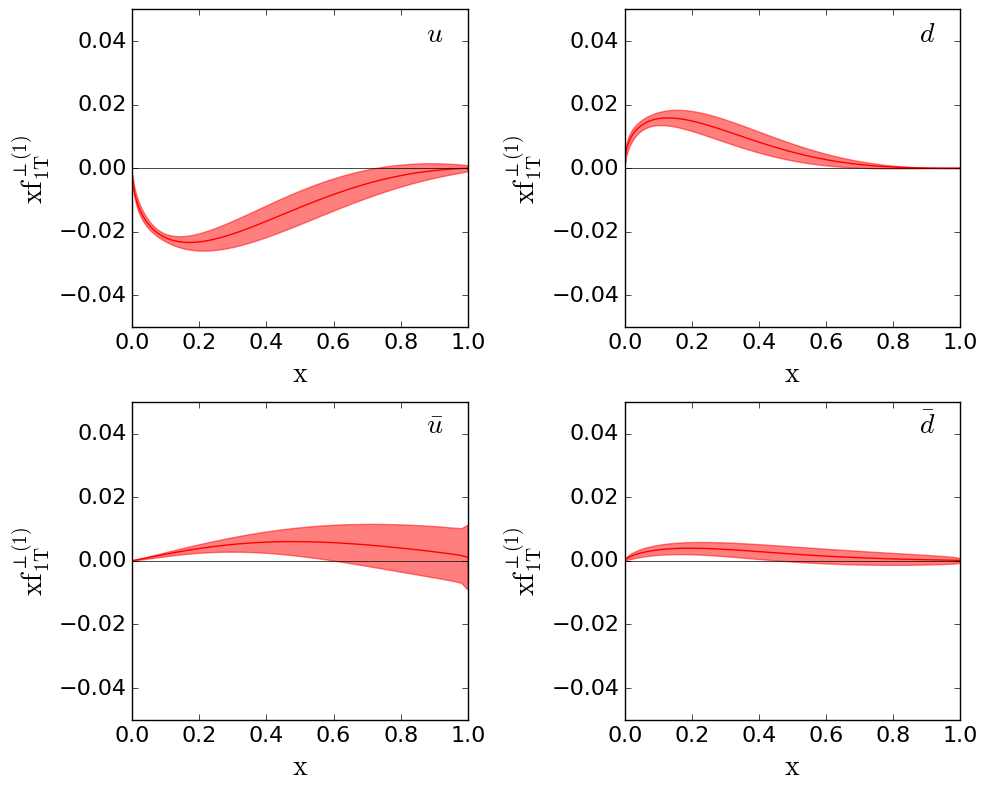

In [61]:
nrows,ncols=2,2
py.figure(figsize=(ncols*5,nrows*4))

ax=py.subplot(nrows,ncols,1)
ax.fill_between(X,X*(hpi['f'][1]-hpi['df'][1]),X*(hpi['f'][1]+hpi['df'][1]),color='r',alpha=0.5,label=r'$u$')
ax.plot(X,X*hpi['f'][1],color='r')
ax.set_xlabel(r'$\rm x$',size=20)
ax.set_ylabel(r'$\rm xf_{1T}^{\perp(1)}$',size=20)
ax.set_xlim(0,1)
ax.set_ylim(-0.05,0.05)
ax.axhline(y=0,color='k',lw=0.5)
ax.tick_params(axis='both', which='major', labelsize=16)
ax.set_xticks([0.0,0.2,0.4,0.6,0.8,1.0])
ax.set_yticks([-0.04,-0.02,0,0.02,0.04])
ax.text(0.9,0.9,r'$u$',horizontalalignment='center',transform=ax.transAxes,fontsize=20)
#ax.legend(fontsize=20,frameon=False)

ax=py.subplot(nrows,ncols,2)
ax.fill_between(X,X*(hpi['f'][3]-hpi['df'][3]),X*(hpi['f'][3]+hpi['df'][3]),color='r',alpha=0.5,label=r'$d$')
ax.plot(X,X*hpi['f'][3],color='r')
ax.set_xlabel(r'$\rm x$',size=20)
ax.set_ylabel(r'$\rm xf_{1T}^{\perp(1)}$',size=20)
ax.set_xlim(0,1)
ax.set_ylim(-0.05,0.05)
ax.axhline(y=0,color='k',lw=0.5)
ax.tick_params(axis='both', which='major', labelsize=16)
ax.set_xticks([0.0,0.2,0.4,0.6,0.8,1.0])
ax.set_yticks([-0.04,-0.02,0,0.02,0.04])
ax.text(0.9,0.9,r'$d$',horizontalalignment='center',transform=ax.transAxes,fontsize=20)
#ax.legend(fontsize=20,frameon=False)

ax=py.subplot(nrows,ncols,3)
ax.fill_between(X,X*(hpi['f'][2]-hpi['df'][2]),X*(hpi['f'][2]+hpi['df'][2]),color='r',alpha=0.5,label=r'$\bar{u}$')
ax.plot(X,X*hpi['f'][2],color='r')
ax.set_xlabel(r'$\rm x$',size=20)
ax.set_ylabel(r'$\rm xf_{1T}^{\perp(1)}$',size=20)
ax.set_xlim(0,1)
ax.set_ylim(-0.05,0.05)
ax.axhline(y=0,color='k',lw=0.5)
ax.tick_params(axis='both', which='major', labelsize=16)
ax.set_xticks([0.0,0.2,0.4,0.6,0.8,1.0])
ax.set_yticks([-0.04,-0.02,0,0.02,0.04])
ax.text(0.9,0.9,r'$\bar{u}$',horizontalalignment='center',transform=ax.transAxes,fontsize=20)
#ax.legend(fontsize=20,frameon=False)

ax=py.subplot(nrows,ncols,4)
ax.fill_between(X,X*(hpi['f'][4]-hpi['df'][4]),X*(hpi['f'][4]+hpi['df'][4]),color='r',alpha=0.5,label=r'$\bar{d}$')
ax.plot(X,X*hpi['f'][4],color='r')
ax.set_xlabel(r'$\rm x$',size=20)
ax.set_ylabel(r'$\rm xf_{1T}^{\perp(1)}$',size=20)
ax.set_xlim(0,1)
ax.set_ylim(-0.05,0.05)
ax.axhline(y=0,color='k',lw=0.5)
ax.tick_params(axis='both', which='major', labelsize=16)
ax.set_xticks([0.0,0.2,0.4,0.6,0.8,1.0])
ax.set_yticks([-0.04,-0.02,0,0.02,0.04])
ax.text(0.9,0.9,r'$\bar{d}$',horizontalalignment='center',transform=ax.transAxes,fontsize=20)
#ax.legend(fontsize=20,frameon=False)


py.tight_layout()
py.savefig('%s/sivers_u_d_ubar_dbar.pdf'%path2figs)

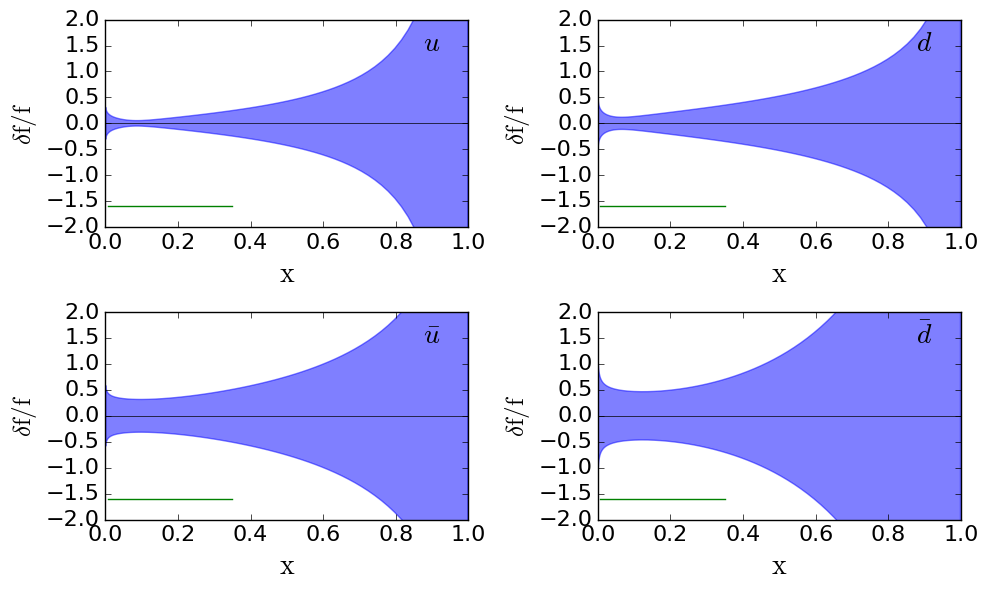

In [80]:
nrows,ncols=2,2
py.figure(figsize=(ncols*5,nrows*3))

ax=py.subplot(nrows,ncols,1)
ax.fill_between(X,hpi['df'][1]/hpi['f'][1],-hpi['df'][1]/hpi['f'][1],color='b',alpha=0.5,label=r'$u$')
ax.set_xlabel(r'$\rm x$',size=20)
ax.set_ylabel(r'$\rm {\delta}f/f}$',size=18)
ax.axhline(y=0,color='k',lw=0.5)
ax.set_xlim(0,1)
ax.set_ylim(-2,2)
ax.tick_params(axis='both', which='major', labelsize=16)
ax.set_xticks([0.0,0.2,0.4,0.6,0.8,1.0])
ax.text(0.9,0.85,r'$u$',horizontalalignment='center',transform=ax.transAxes,fontsize=20)
#ax.legend(fontsize=20,frameon=False)
# min max from data
zmin=np.amin(data['sidis']['tabs']['compass']['x'])
zmax=np.amax(data['sidis']['tabs']['jlab']['x'])
ymin,ymax=ax.get_ylim()
dy=ymax-ymin
ax.plot([zmin,zmax],[ymin+dy*0.1,ymin+dy*0.1],'g-')

ax=py.subplot(nrows,ncols,2)
ax.fill_between(X,hpi['df'][3]/hpi['f'][3],-hpi['df'][3]/hpi['f'][3],color='b',alpha=0.5,label=r'$d$')
ax.set_xlabel(r'$\rm x$',size=20)
ax.set_ylabel(r'$\rm {\delta}f/f$',size=18)
ax.set_xlim(0,1)
ax.set_ylim(-2,2)
ax.axhline(y=0,color='k',lw=0.5)
ax.tick_params(axis='both', which='major', labelsize=16)
ax.set_xticks([0.0,0.2,0.4,0.6,0.8,1.0])
ax.text(0.9,0.85,r'$d$',horizontalalignment='center',transform=ax.transAxes,fontsize=20)
#ax.legend(fontsize=20,frameon=False)
ax.plot([zmin,zmax],[ymin+dy*0.1,ymin+dy*0.1],'g-')

ax=py.subplot(nrows,ncols,3)
ax.fill_between(X,hpi['df'][2]/hpi['f'][2],-hpi['df'][2]/hpi['f'][2],color='b',alpha=0.5,label=r'$\bar{u}$')
ax.set_xlabel(r'$\rm x$',size=20)
ax.set_ylabel(r'$\rm {\delta}f/f$',size=18)
ax.set_xlim(0,1)
ax.set_ylim(-2,2)
ax.axhline(y=0,color='k',lw=0.5)
ax.tick_params(axis='both', which='major', labelsize=16)
ax.set_xticks([0.0,0.2,0.4,0.6,0.8,1.0])
ax.text(0.9,0.85,r'$\bar{u}$',horizontalalignment='center',transform=ax.transAxes,fontsize=20)
#ax.legend(fontsize=20,frameon=False)
ax.plot([zmin,zmax],[ymin+dy*0.1,ymin+dy*0.1],'g-')

ax=py.subplot(nrows,ncols,4)
ax.fill_between(X,hpi['df'][4]/hpi['f'][4],-hpi['df'][4]/hpi['f'][4],color='b',alpha=0.5,label=r'$\bar{d}$')
ax.set_xlabel(r'$\rm x$',size=20)
ax.set_ylabel(r'$\rm {\delta}f/f$',size=18)
ax.set_xlim(0,1)
ax.set_ylim(-2,2)
ax.axhline(y=0,color='k',lw=0.5)
ax.tick_params(axis='both', which='major', labelsize=16)
ax.set_xticks([0.0,0.2,0.4,0.6,0.8,1.0])
ax.text(0.9,0.85,r'$\bar{d}$',horizontalalignment='center',transform=ax.transAxes,fontsize=20)
#ax.legend(fontsize=20,frameon=False)
ax.plot([zmin,zmax],[ymin+dy*0.1,ymin+dy*0.1],'g-')

py.tight_layout()
py.savefig('%s/relative-error.pdf'%path2figs)

### plot data and theory

In [81]:
data=load('%s/%s'%(path2results,'data_and_thy.dat'))

In [93]:
SIVERS=pd.concat([pd.DataFrame(conf['resman'].sidisres.tabs[idx]) \
              for idx in conf['resman'].sidisres.tabs.keys()])

SIVERS.columns

Index([ u'Dependence',       u'Ebeam',           u'N',          u'Q2',
             u'Shift',          u'W2',       u'alpha',         u'col',
              u'dthy',          u'dy',      u'hadron',           u'i',
               u'obs',          u'pT', u'r-residuals',   u'residuals',
             u'shift',      u'stat_u',     u'systabs',   u'systabs_u',
           u'systrel',      u'target',         u'thy',       u'value',
                 u'x',           u'y',          u'yh',          u'yp',
                 u'z'],
      dtype='object')

In [107]:
SIVERS['pT']

0    0.1100
1    0.2110
2    0.2900
3    0.3700
4    0.4880
5    0.6690
0    0.4890
1    0.4090
2    0.3720
3    0.3560
4    0.3440
5    0.3390
6    0.3440
0    0.3460
1    0.3770
2    0.4030
3    0.4290
4    0.4530
5    0.4650
6    0.4650
0    0.1100
1    0.2110
2    0.2900
3    0.3690
4    0.4880
5    0.6700
0    0.4840
1    0.4030
2    0.3670
3    0.3520
      ...  
3    0.5500
4    0.5600
5    0.5800
0    0.1540
1    0.2516
2    0.3501
3    0.4491
4    0.5485
5    0.6699
6    0.8183
0    0.5700
1    0.5600
2    0.5400
3    0.5400
4    0.5300
5    0.5300
6    0.5300
7    0.5400
8    0.5400
0    0.5100
1    0.5300
2    0.5400
3    0.5600
4    0.5600
5    0.5700
0    0.4600
1    0.4000
2    0.3300
3    0.2600
0    0.3800
Name: pT, dtype: float64

KeyError: u'PT'

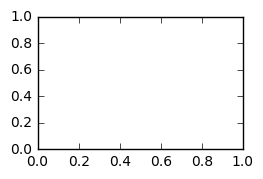

In [109]:
 def get_key(K,tar,had,col,tabs,dep):
    kk=None
    for k in K:
        d=tabs
        #print '-->',d['target'].values[0],d['hadron'].values[0],d['col'].values[0].upper()
        if tar==d['target'].values[0] \
            and had==d['hadron'].values[0] \
            and dep==d['Dependence'].values[0] \
            and col==d['col'].values[0].upper().strip(): kk=k
    return kk

tabs=SIVERS
#resman.sidisres.tabs
def plot(idx,dep,tar,had,col,legend=False):
    #print tar,had,col
    k=get_key(tabs.keys(),tar,had,col,tabs,dep)
    d1=tabs
    ax=py.subplot(nrows,ncols,idx)
    dep=d1['Dependence'].values[0]
    #obs=d['obs'].values[0]
    tar=d1['target'].values[0]
    had=d1['hadron'].values[0]
    if dep=='pT': dep='pT'
    sign=1
    shift=0
    #if '-' in had:shift=0.005
    #if '-' in had: e=ax.errorbar(d1[dep]+shift,sign*d1['value'],d1['alpha'],fmt='bv')
    #if '+' in had: e=ax.errorbar(d1[dep]+shift,sign*d1['value'],d1['alpha'],fmt='r^')
    b1=ax.fill_between(d1[dep],sign*(d1['thy']-d1['dthy']),sign*(d1['thy']+d1['dthy']),color='Yellow',alpha=0.5)
    l1,=ax.plot(d1[dep],sign*d1['thy'],'k--')
    if dep=='x': ax.set_xlabel(r'$x$',size=20)
    if dep=='z': ax.set_xlabel(r'$z$',size=20)
    if dep=='PT': ax.set_xlabel(r'$P_{hT}$',size=20)
    ax.xaxis.set_label_coords(0.95, -0.02)
    if dep=='x':
        ax.set_xlim(0,0.3)
        ax.set_xticks([0.1,0.2])
    if dep=='z':
        ax.set_xlim(0.2,0.65)
        ax.set_xticks([0.3,0.4,0.5])
    if dep=='pT':
        ax.set_xlim(0.1,0.9)
        ax.set_xticks([0.2,0.4,0.6])

    #if dep=='pT':ax.set_xlim(0.2,0.65)
    #ax.tick_params(axis='both', which='major', labelsize=16)
    #ax.tick_params(axis='both', which='major', labelsize=20)
    #ax.set_ylabel(obs)
    #ax.set_title('%s %s %s'%(tar,had.replace('+','').replace('-',''),col))
    #ax.set_xlim(0,0.3)
    #ax.set_ylim(-.1,.1)
    #ax.set_xticklabels([])
    ax.text(0.1,0.1,col,transform=ax.transAxes,size=10)
    if legend: return ax,(b1,l1),e
    else: return ax


nrows,ncols=6,3
py.figure(figsize=(ncols*3,nrows*2))

ax=plot(1,'pT','proton','pi+','HERMES')

#ax=plot(1,'x','proton','pi+','HERMES')
#ax=plot(1,'x','proton','pi-','HERMES')
#ax.set_ylabel(r'$A_{UT}^{C}(p,\pi)$',size=20)
#ax=plot(2,'z','proton','pi+','HERMES')
#ax=plot(2,'z','proton','pi-','HERMES')
#ax=plot(3,'pt','proton','pi+','HERMES')
#ax=plot(3,'pt','proton','pi-','HERMES')

#ax=plot(4,'x','proton','pi+','COMPASS')
#ax=plot(4,'x','proton','pi-','COMPASS')
#ax.set_ylabel(r'$A_{UT}^{C}(p,\pi)$',size=20)
#ax=plot(5,'z','proton','pi+','COMPASS')
#ax=plot(5,'z','proton','pi-','COMPASS')
#ax=plot(6,'pt','proton','pi+','COMPASS')
#ax=plot(6,'pt','proton','pi-','COMPASS')

#ax=plot(7,'x','deuteron','pi+','COMPASS')
#ax=plot(7,'x','deuteron','pi-','COMPASS')
#ax.set_ylabel(r'$A_{UT}^{C}(d,\pi)$',size=20)
#ax=plot(8,'z','deuteron','pi+','COMPASS')
#ax=plot(8,'z','deuteron','pi-','COMPASS')
#ax,b1,ep=plot(9,'pT','deuteron','pi+','COMPASS',legend=True)
#ax,b1,em=plot(9,'pT','deuteron','pi-','COMPASS',legend=True)

# ax=plot(10,'x','proton','k+','HERMES')
# ax=plot(10,'x','proton','k-','HERMES')
# ax.set_ylabel(r'$A_{UT}^{C}(p,K)$',size=20)
# ax=plot(11,'z','proton','k+','HERMES')
# ax=plot(11,'z','proton','k-','HERMES')
# ax=plot(12,'pt','proton','k+','HERMES')
# ax=plot(12,'pt','proton','k-','HERMES')

# ax=plot(13,'x','proton','k+','COMPASS')
# ax=plot(13,'x','proton','k-','COMPASS')
# ax.set_ylabel(r'$A_{UT}^{C}(p,K)$',size=20)
# ax=plot(14,'z','proton','k+','COMPASS')
# ax=plot(14,'z','proton','k-','COMPASS')
# ax=plot(15,'pt','proton','k+','COMPASS')
# ax=plot(15,'pt','proton','k-','COMPASS')


# ax=plot(16,'x','deuteron','k+','COMPASS')
# ax=plot(16,'x','deuteron','k-','COMPASS')
# ax.set_ylabel(r'$A_{UT}^{C}(d,K)$',size=20)
# ax,b1,ep=plot(17,'z','deuteron','k+','COMPASS',legend=True)
# ax,b1,em=plot(17,'z','deuteron','k-','COMPASS',legend=True)
# ax=plot(18,'pT','deuteron','k+','COMPASS')
# ax=plot(18,'pT','deuteron','k-','COMPASS')
ax.legend([b1,ep,em],[r'$\rm SIDIS$',r'$(\pi^+)$',r'$(\pi^-)$']\
           ,loc='upper center', bbox_to_anchor=(-0.2, -0.3)\
           ,fancybox=True, shadow=False, ncol=4,fontsize=17)


py.subplots_adjust(wspace=0.3, hspace=0.2,left=0.11, bottom=0.1, right=0.95, top=0.95)